## Convolutional GAN

Inspired by Pavlou and Kourkoumelis (2022) with some adaptations.

Eleftherios Pavlou and Nikolaos Kourkoumelis. Deep adversarial data augmentation for biomedical spectroscopy: Application to modelling raman spectra of bone. Chemometrics and Intelligent Laboratory Systems, 228:104634, 2022.

In [1]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# PyTorch Requirements
import torch
import torch.nn as nn
from torch import Tensor
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam

%matplotlib inline

In [2]:
# Load and prepare data
data = pd.read_csv("../../data/cyclohexane.csv", header=0)

# raw data and best sample
X = data.drop("solvent", axis=1)
best_sample = X.iloc[0].to_numpy().reshape(-1, 1)

## Visualise raw data

In [3]:
plt.rcParams['font.size'] = 12
xticks = np.linspace(0, X.shape[1]-1, 10, dtype=int)
xlabels = X.columns[xticks].astype(float).astype(int).values

def build_plot():
    fig, ax = plt.subplots(figsize=(8, 4))
    plt.gca().spines['right'].set_color('none')
    plt.gca().spines['top'].set_color('none')
    plt.ylabel("Intensity (a.u)")
    plt.xlabel("Raman Shift (cm$^{-1}$)")
    plt.xlim([-20, 3296])
    plt.xticks(xticks, labels=xlabels)
    plt.grid(False)
    
    return fig

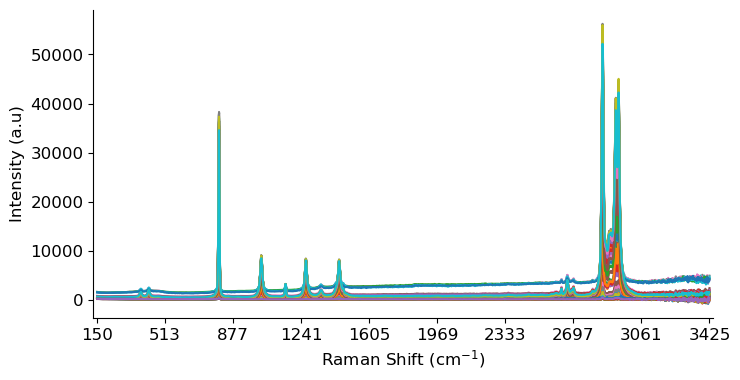

In [4]:
# Raw Spectra
_ = build_plot()
plt.plot(X.T);

## Define required functions

In [5]:
# First we need a custom Torch tensor Dataset to load in the data
class CyclohexaneDataTensor(Dataset):
    def __init__(self, data_X: Tensor, transform_list=None):
        """
        Initialises object and performs data transformation if desired
        
        Args:
            data_X (array-like):
                Spectral data matrix (NumPy array or PyTorch Tensor).
            transform_list (list):
                List of transformations to apply to data (e.g., normalizing, scaling).

        """
        if not isinstance(data_X, (np.ndarray, Tensor)):
            raise TypeError("data_X must be a NumPy array or PyTorch tensor")
            
        self.X_tensor = torch.as_tensor(data_X, dtype=torch.float32)
        self.transforms = transform_list

    def __getitem__(self, index) -> Tensor:
        x = self.X_tensor[index].clone()

        if self.transforms:
            for transform in self.transforms:
                x = transform(x)
        return x

    def __len__(self) -> int:
        return self.X_tensor.size(0)

# function to visualise samples as the model trains and progresses
def draw_synthetic_sample(model: nn.Module, epoch: int, sample_shape: int):
    """
    Function that takes in the generator, generates a sample and plots it.

    Args:
        model (nn.Module):
            Generator model.
        epoch (int):
            current epoch in training.
        noise_input (array-like):
            initial noise to feed forward
    """
    model.eval()

    # `detach` to remove from graph and no gradients computed
    noise = torch.randn(4, 1, Z_DIM, device=DEVICE).detach()
    z_samples = model(noise).detach().cpu() # move to CPU for visualisation

    # loop N samples
    for i in range(z_samples.size(0)):
        plt.figure()
        plt.plot(z_samples[i].numpy().reshape(sample_shape))
        plt.show()

In [6]:
# Define separate models so we can save the Generator and discard the Discriminator later
class Generator(nn.Module):
    """
    Generator for 1D Raman signals
    Progressive convoutional upsampling until signal dimensionality is matched
    """
    def __init__(self, output_size: int = 3276):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            
            # dimensions - (Batch, Channel_in, Width_in) i.e. input = [N, 1, 128]
            nn.ConvTranspose1d(in_channels=1, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(),

            nn.ConvTranspose1d(in_channels=256, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False), 
            nn.LeakyReLU(),

            nn.ConvTranspose1d(in_channels=128, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False), 
            nn.LeakyReLU(),

            nn.ConvTranspose1d(in_channels=64, out_channels=32, kernel_size=4, stride=2, padding=1, bias=False), 
            nn.LeakyReLU(),

            nn.ConvTranspose1d(in_channels=32, out_channels=16, kernel_size=4, stride=2, padding=1, bias=False), 
            nn.LeakyReLU(),

            nn.ConvTranspose1d(in_channels=16, out_channels=8, kernel_size=4, stride=1, padding=0, bias=False), 
            nn.LeakyReLU(),

            nn.ConvTranspose1d(in_channels=8, out_channels=1, kernel_size=3, stride=1, padding=0, bias=False), 
            nn.LeakyReLU(),

            nn.Linear(in_features=4101, out_features=output_size)
        )

    def forward(self, x: Tensor) -> Tensor:
        # for layer in self.main:
        #     print(x.size())
        #     x = layer(x)
        # return x
        return self.main(x)

class Discriminator(nn.Module):
    """
    Discriminator for classfying real vs fake 1D Raman signals
    Outputs single scalar probability
    """
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            
            # dimensions - (Batch, Channel_in, Width_in) i.e. input = [1, 1, 3276]
            nn.Conv1d(in_channels=1, out_channels=8, kernel_size=3, stride=2, bias=False),
            nn.LeakyReLU(),
            nn.MaxPool1d(kernel_size=2),
            nn.Dropout(p=0.1),

            nn.Conv1d(in_channels=8, out_channels=16, kernel_size=3, stride=2, bias=False),
            nn.LeakyReLU(),
            nn.MaxPool1d(kernel_size=2),
            nn.Dropout(p=0.1),

            nn.Conv1d(in_channels=16, out_channels=32, kernel_size=3, stride=2, bias=False),
            nn.LeakyReLU(),
            nn.MaxPool1d(kernel_size=2),
            nn.Dropout(p=0.1),

            nn.Conv1d(in_channels=32, out_channels=64, kernel_size=3, stride=2, bias=False),
            nn.LeakyReLU(),
            nn.MaxPool1d(kernel_size=2),
            nn.Dropout(p=0.1),

            nn.Flatten(start_dim=1),
            nn.Linear(in_features=768, out_features=64),
            nn.Linear(in_features=64, out_features=1)
            
            # nn.Sigmoid() # remove to use BCELossWithLogits (more numerically stable)
        )
        
    def forward(self, x: Tensor) -> Tensor:
        # for layer in self.main:
        #     print(x.size())
        #     x = layer(x)
        # return x
        return self.main(x)

In [7]:
# Constants and hyperparameters
EPOCHS: int = 35000
BATCH_SIZE: int = 64
Z_DIM: int = 128
SAMPLE_SHAPE: int = X.shape[1]
GLR: float = 2e-3
DLR: float = 2e-5
BETA_1: float = 0.9
BETA_2: float = 0.999
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Training on {DEVICE}")

# Configure data in Torch Dataset for training
X_copy = X.copy().to_numpy().reshape(-1, 1, SAMPLE_SHAPE)

# load data into Torch Tensor
X_train = CyclohexaneDataTensor(X_copy)
train_loader = DataLoader(X_train, batch_size=BATCH_SIZE, shuffle=True, drop_last=False)

# Define models and send them to active device
generator = Generator().to(DEVICE)
discriminator = Discriminator().to(DEVICE)

# define our loss function and optimisers
loss_fn = nn.BCEWithLogitsLoss().to(DEVICE)
opt_G = torch.optim.Adam(generator.parameters(), lr=GLR, betas=(BETA_1, BETA_2))
opt_D = torch.optim.Adam(discriminator.parameters(), lr=DLR, betas=(BETA_1, BETA_2))

Training on cuda:0


Epoch:[1/35000] 	Batch:[1/3] 	Loss_D:13.9303 	Loss_G:0.6931 	D(x):-27.1608 	D(G(z)):0.0000
Epoch:[1/35000] 	Batch:[2/3] 	Loss_D:12.4396 	Loss_G:0.6927 	D(x):-23.0817 	D(G(z)):0.0008
Epoch:[1/35000] 	Batch:[3/3] 	Loss_D:11.9542 	Loss_G:0.6922 	D(x):-22.4655 	D(G(z)):0.0018
Epoch:[2/35000] 	Batch:[1/3] 	Loss_D:7.9620 	Loss_G:0.6915 	D(x):-14.5687 	D(G(z)):0.0033
Epoch:[2/35000] 	Batch:[2/3] 	Loss_D:11.9600 	Loss_G:0.6885 	D(x):-22.4080 	D(G(z)):0.0092
Epoch:[2/35000] 	Batch:[3/3] 	Loss_D:14.2185 	Loss_G:0.6804 	D(x):-27.7018 	D(G(z)):0.0256
Epoch:[3/35000] 	Batch:[1/3] 	Loss_D:7.4326 	Loss_G:0.6605 	D(x):-14.0079 	D(G(z)):0.0664
Epoch:[3/35000] 	Batch:[2/3] 	Loss_D:7.7007 	Loss_G:0.6203 	D(x):-12.9640 	D(G(z)):0.1515
Epoch:[3/35000] 	Batch:[3/3] 	Loss_D:6.5434 	Loss_G:0.5357 	D(x):-12.0765 	D(G(z)):0.3445
Epoch:[4/35000] 	Batch:[1/3] 	Loss_D:4.8124 	Loss_G:0.3932 	D(x):-7.0805 	D(G(z)):0.7327
Epoch:[4/35000] 	Batch:[2/3] 	Loss_D:5.2762 	Loss_G:0.2098 	D(x):-4.6691 	D(G(z)):1.4664
Epoch:[

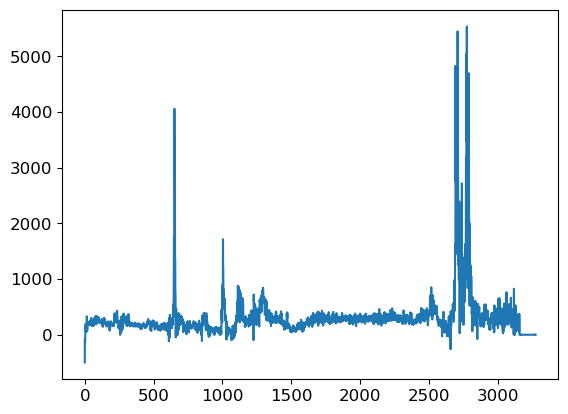

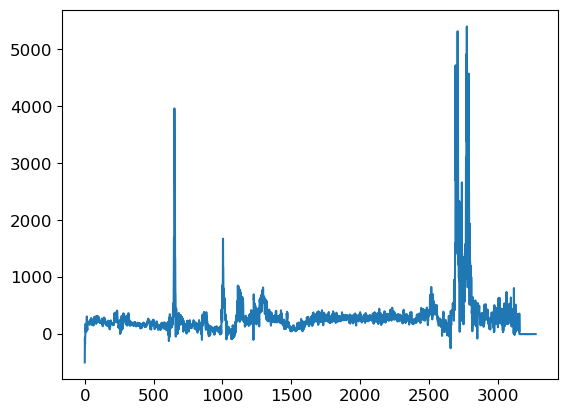

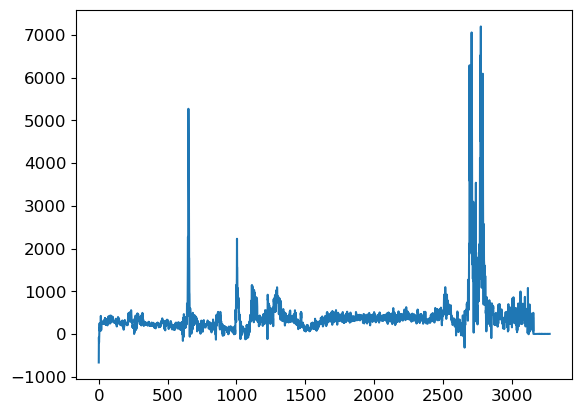

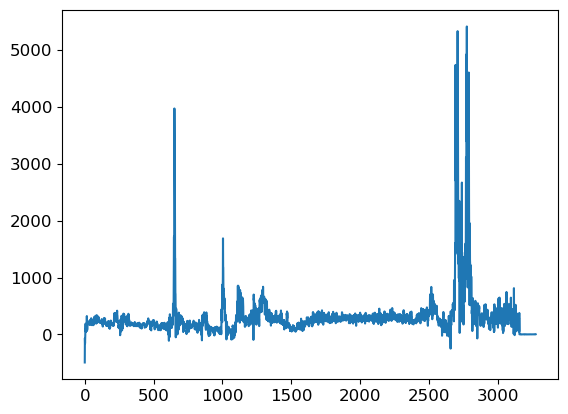

Epoch:[2001/35000] 	Batch:[1/3] 	Loss_D:0.6776 	Loss_G:0.7086 	D(x):0.7639 	D(G(z)):0.0276
Epoch:[2001/35000] 	Batch:[2/3] 	Loss_D:0.6971 	Loss_G:0.7054 	D(x):0.7371 	D(G(z)):0.0194
Epoch:[2001/35000] 	Batch:[3/3] 	Loss_D:0.6075 	Loss_G:0.7506 	D(x):0.8921 	D(G(z)):-0.0617
Epoch:[2002/35000] 	Batch:[1/3] 	Loss_D:0.6942 	Loss_G:0.6843 	D(x):0.8516 	D(G(z)):0.0773
Epoch:[2002/35000] 	Batch:[2/3] 	Loss_D:0.7163 	Loss_G:0.6243 	D(x):0.8956 	D(G(z)):0.1967
Epoch:[2002/35000] 	Batch:[3/3] 	Loss_D:0.6949 	Loss_G:0.6536 	D(x):1.3806 	D(G(z)):0.1437
Epoch:[2003/35000] 	Batch:[1/3] 	Loss_D:0.6609 	Loss_G:0.7080 	D(x):1.0315 	D(G(z)):0.0498
Epoch:[2003/35000] 	Batch:[2/3] 	Loss_D:0.6813 	Loss_G:0.7496 	D(x):0.8759 	D(G(z)):-0.0374
Epoch:[2003/35000] 	Batch:[3/3] 	Loss_D:0.6833 	Loss_G:0.7267 	D(x):0.1623 	D(G(z)):-0.0199
Epoch:[2004/35000] 	Batch:[1/3] 	Loss_D:0.6696 	Loss_G:0.7232 	D(x):1.0523 	D(G(z)):0.0146
Epoch:[2004/35000] 	Batch:[2/3] 	Loss_D:0.6887 	Loss_G:0.8936 	D(x):0.8536 	D(G(z)):-0.

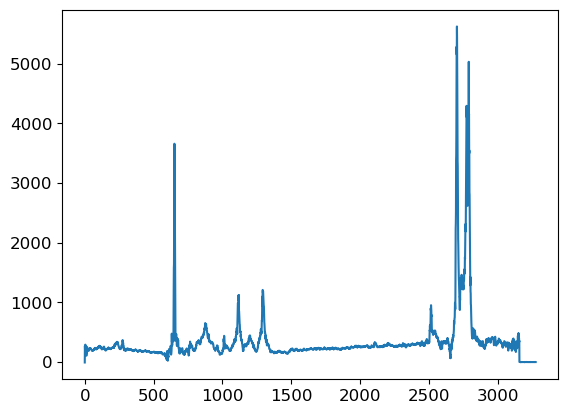

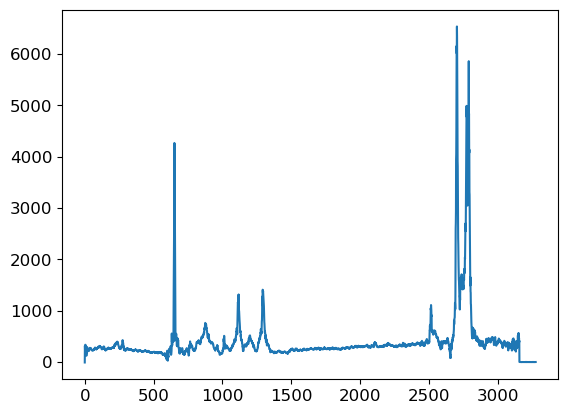

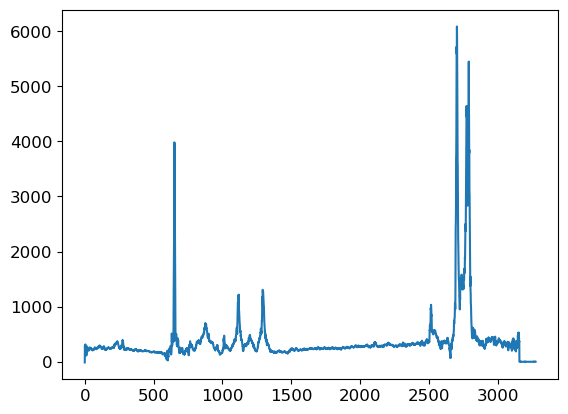

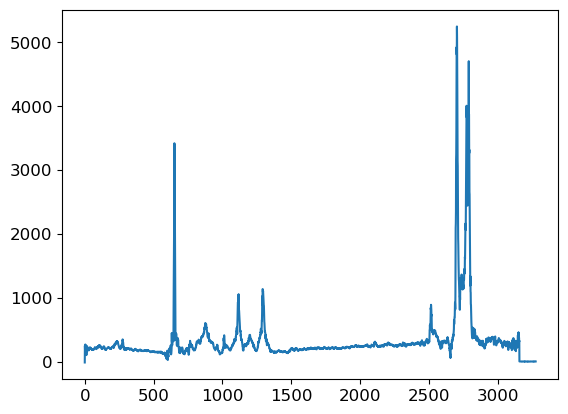

Epoch:[4001/35000] 	Batch:[1/3] 	Loss_D:0.6367 	Loss_G:0.8172 	D(x):0.8558 	D(G(z)):-0.1984
Epoch:[4001/35000] 	Batch:[2/3] 	Loss_D:0.6154 	Loss_G:0.7537 	D(x):1.0282 	D(G(z)):-0.0769
Epoch:[4001/35000] 	Batch:[3/3] 	Loss_D:0.6041 	Loss_G:0.7106 	D(x):0.6784 	D(G(z)):-0.0053
Epoch:[4002/35000] 	Batch:[1/3] 	Loss_D:0.6605 	Loss_G:0.7511 	D(x):0.7750 	D(G(z)):-0.0733
Epoch:[4002/35000] 	Batch:[2/3] 	Loss_D:0.6100 	Loss_G:0.7235 	D(x):1.4439 	D(G(z)):-0.0153
Epoch:[4002/35000] 	Batch:[3/3] 	Loss_D:0.6937 	Loss_G:0.7274 	D(x):0.5335 	D(G(z)):-0.0126
Epoch:[4003/35000] 	Batch:[1/3] 	Loss_D:0.6415 	Loss_G:0.7457 	D(x):0.9683 	D(G(z)):-0.0495
Epoch:[4003/35000] 	Batch:[2/3] 	Loss_D:0.6353 	Loss_G:0.7779 	D(x):0.9240 	D(G(z)):-0.1166
Epoch:[4003/35000] 	Batch:[3/3] 	Loss_D:0.6416 	Loss_G:0.7930 	D(x):1.1275 	D(G(z)):-0.1636
Epoch:[4004/35000] 	Batch:[1/3] 	Loss_D:0.7083 	Loss_G:0.7728 	D(x):0.6349 	D(G(z)):-0.1032
Epoch:[4004/35000] 	Batch:[2/3] 	Loss_D:0.6640 	Loss_G:0.7627 	D(x):0.7371 	D(G(

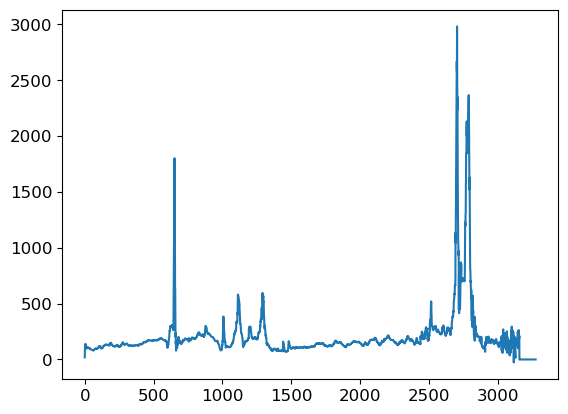

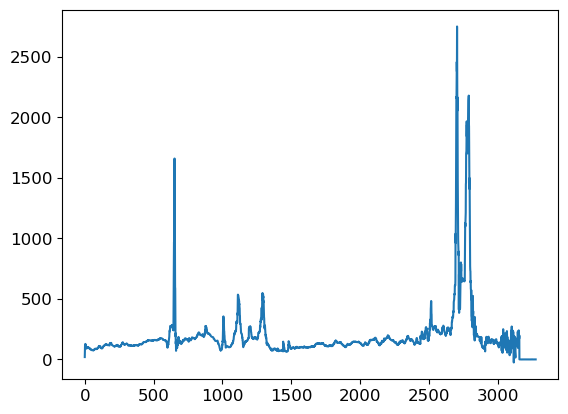

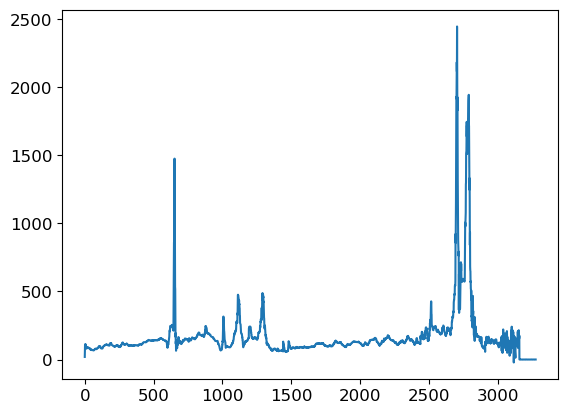

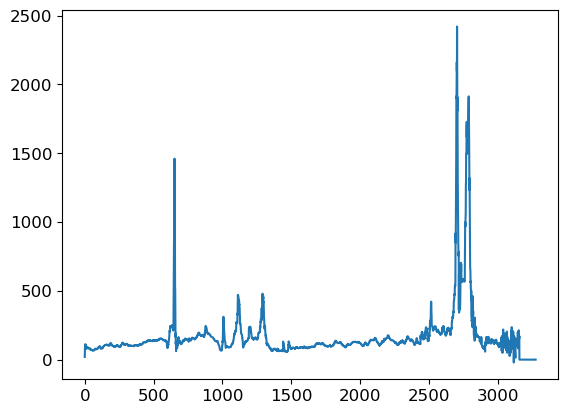

Epoch:[6001/35000] 	Batch:[1/3] 	Loss_D:0.5511 	Loss_G:0.8620 	D(x):1.5210 	D(G(z)):-0.3080
Epoch:[6001/35000] 	Batch:[2/3] 	Loss_D:0.5283 	Loss_G:0.8653 	D(x):1.5316 	D(G(z)):-0.3155
Epoch:[6001/35000] 	Batch:[3/3] 	Loss_D:0.5643 	Loss_G:0.8931 	D(x):1.0184 	D(G(z)):-0.3635
Epoch:[6002/35000] 	Batch:[1/3] 	Loss_D:0.5339 	Loss_G:0.8680 	D(x):1.8300 	D(G(z)):-0.3205
Epoch:[6002/35000] 	Batch:[2/3] 	Loss_D:0.5544 	Loss_G:0.8556 	D(x):1.5683 	D(G(z)):-0.2983
Epoch:[6002/35000] 	Batch:[3/3] 	Loss_D:0.5608 	Loss_G:0.8443 	D(x):0.5852 	D(G(z)):-0.2806
Epoch:[6003/35000] 	Batch:[1/3] 	Loss_D:0.5085 	Loss_G:0.8649 	D(x):2.7180 	D(G(z)):-0.3150
Epoch:[6003/35000] 	Batch:[2/3] 	Loss_D:0.5715 	Loss_G:0.8412 	D(x):0.9613 	D(G(z)):-0.2735
Epoch:[6003/35000] 	Batch:[3/3] 	Loss_D:0.5748 	Loss_G:0.8152 	D(x):1.0718 	D(G(z)):-0.2267
Epoch:[6004/35000] 	Batch:[1/3] 	Loss_D:0.5359 	Loss_G:0.8403 	D(x):1.6719 	D(G(z)):-0.2724
Epoch:[6004/35000] 	Batch:[2/3] 	Loss_D:0.5464 	Loss_G:0.8375 	D(x):1.5683 	D(G(

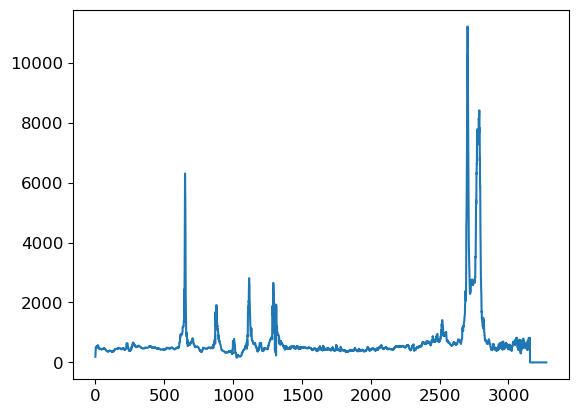

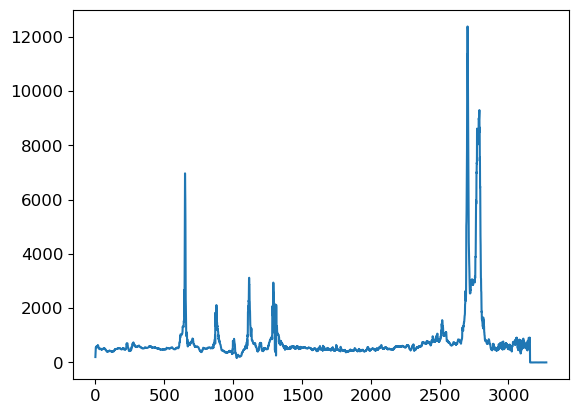

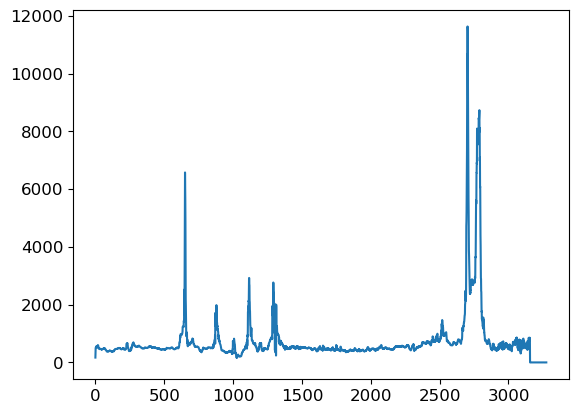

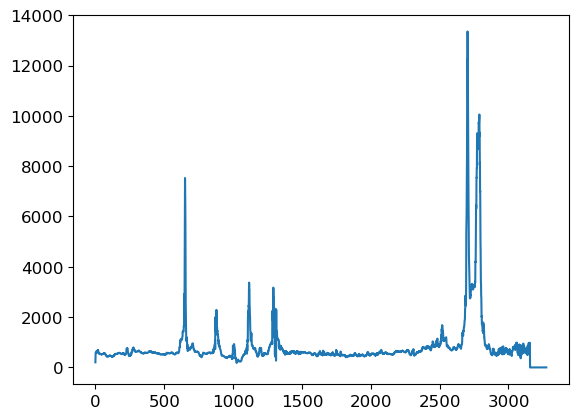

Epoch:[8001/35000] 	Batch:[1/3] 	Loss_D:0.6511 	Loss_G:0.8930 	D(x):0.4008 	D(G(z)):-0.3067
Epoch:[8001/35000] 	Batch:[2/3] 	Loss_D:0.7012 	Loss_G:0.8208 	D(x):0.0740 	D(G(z)):-0.1780
Epoch:[8001/35000] 	Batch:[3/3] 	Loss_D:0.6489 	Loss_G:1.0173 	D(x):0.0439 	D(G(z)):-0.5006
Epoch:[8002/35000] 	Batch:[1/3] 	Loss_D:0.6589 	Loss_G:0.9800 	D(x):0.2143 	D(G(z)):-0.4531
Epoch:[8002/35000] 	Batch:[2/3] 	Loss_D:0.6051 	Loss_G:0.9833 	D(x):0.2684 	D(G(z)):-0.4579
Epoch:[8002/35000] 	Batch:[3/3] 	Loss_D:0.6742 	Loss_G:0.9337 	D(x):0.0039 	D(G(z)):-0.3765
Epoch:[8003/35000] 	Batch:[1/3] 	Loss_D:0.6307 	Loss_G:0.9931 	D(x):0.2974 	D(G(z)):-0.4351
Epoch:[8003/35000] 	Batch:[2/3] 	Loss_D:0.4116 	Loss_G:2.1792 	D(x):0.2748 	D(G(z)):-2.0269
Epoch:[8003/35000] 	Batch:[3/3] 	Loss_D:0.4986 	Loss_G:1.8649 	D(x):0.0722 	D(G(z)):-1.6586
Epoch:[8004/35000] 	Batch:[1/3] 	Loss_D:0.4600 	Loss_G:1.7762 	D(x):0.1432 	D(G(z)):-1.5478
Epoch:[8004/35000] 	Batch:[2/3] 	Loss_D:0.4485 	Loss_G:1.6878 	D(x):0.3310 	D(G(

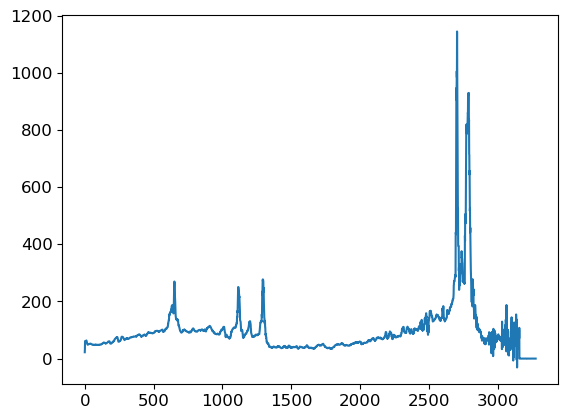

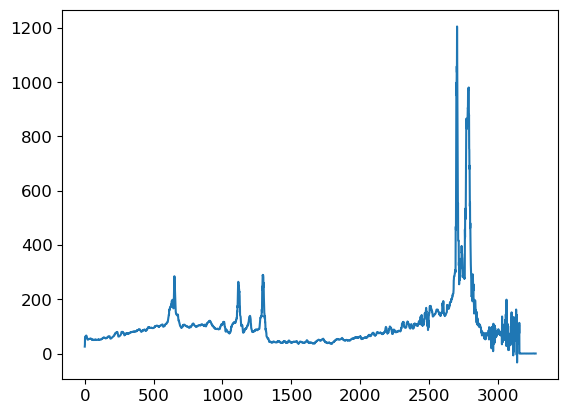

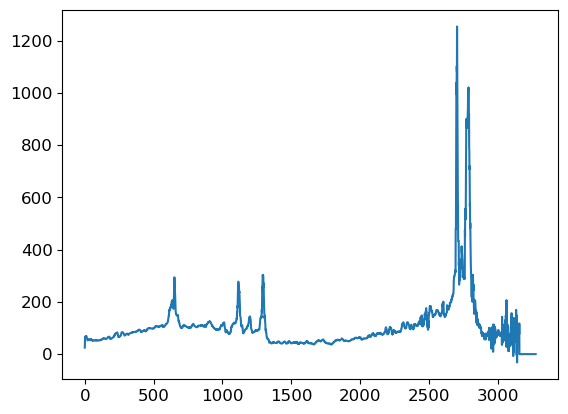

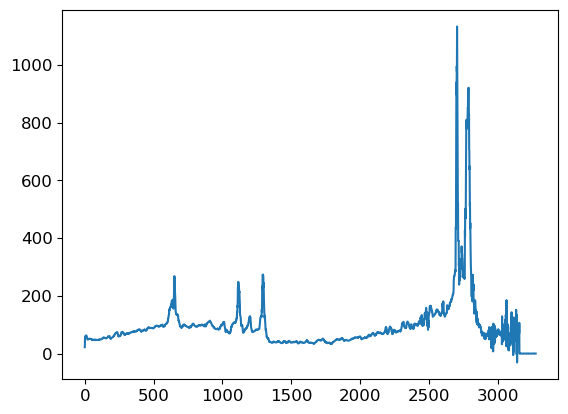

Epoch:[10001/35000] 	Batch:[1/3] 	Loss_D:0.5894 	Loss_G:0.8246 	D(x):1.2774 	D(G(z)):-0.2469
Epoch:[10001/35000] 	Batch:[2/3] 	Loss_D:0.5531 	Loss_G:0.8278 	D(x):2.1920 	D(G(z)):-0.2528
Epoch:[10001/35000] 	Batch:[3/3] 	Loss_D:0.4473 	Loss_G:0.8258 	D(x):5.3702 	D(G(z)):-0.2491
Epoch:[10002/35000] 	Batch:[1/3] 	Loss_D:0.5459 	Loss_G:0.8223 	D(x):2.3288 	D(G(z)):-0.2427
Epoch:[10002/35000] 	Batch:[2/3] 	Loss_D:0.5660 	Loss_G:0.8220 	D(x):2.0013 	D(G(z)):-0.2423
Epoch:[10002/35000] 	Batch:[3/3] 	Loss_D:0.5874 	Loss_G:0.8124 	D(x):1.9756 	D(G(z)):-0.2253
Epoch:[10003/35000] 	Batch:[1/3] 	Loss_D:0.5648 	Loss_G:0.8214 	D(x):1.7776 	D(G(z)):-0.2409
Epoch:[10003/35000] 	Batch:[2/3] 	Loss_D:0.5339 	Loss_G:0.8118 	D(x):2.4632 	D(G(z)):-0.2241
Epoch:[10003/35000] 	Batch:[3/3] 	Loss_D:0.5532 	Loss_G:0.8202 	D(x):2.2872 	D(G(z)):-0.2386
Epoch:[10004/35000] 	Batch:[1/3] 	Loss_D:0.5356 	Loss_G:0.8097 	D(x):2.8269 	D(G(z)):-0.2199
Epoch:[10004/35000] 	Batch:[2/3] 	Loss_D:0.5716 	Loss_G:0.8055 	D(x):1

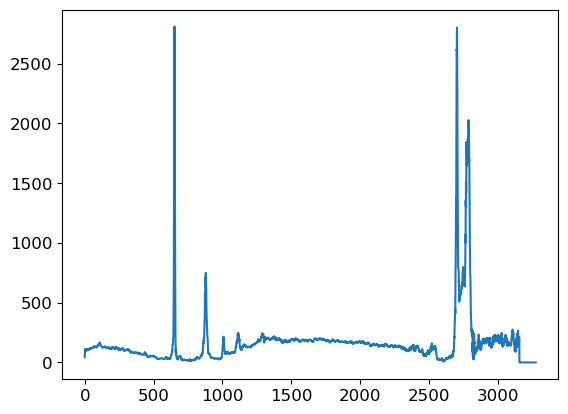

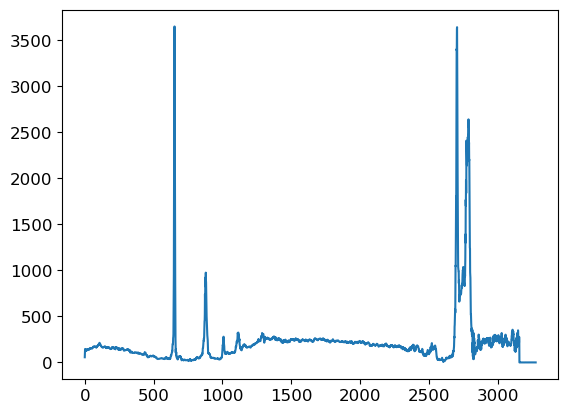

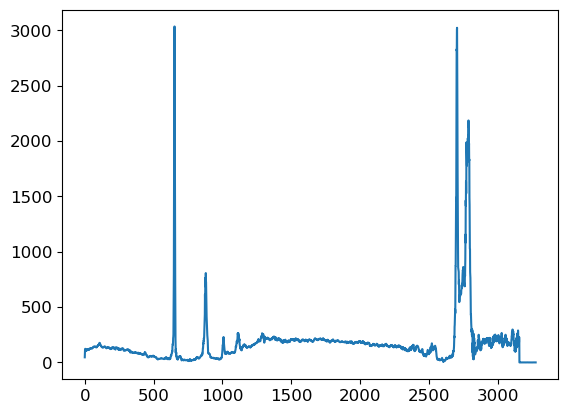

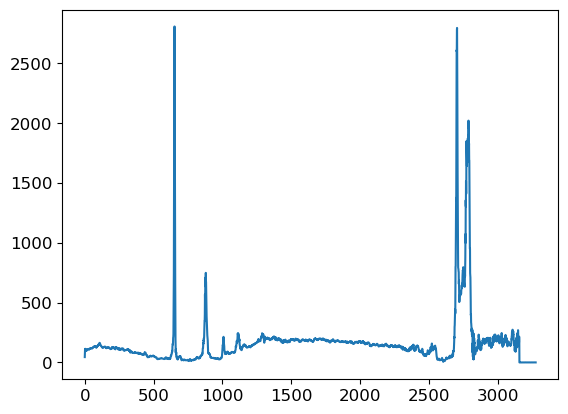

Epoch:[12001/35000] 	Batch:[1/3] 	Loss_D:0.6338 	Loss_G:0.6345 	D(x):1.0059 	D(G(z)):0.1238
Epoch:[12001/35000] 	Batch:[2/3] 	Loss_D:0.6089 	Loss_G:0.6260 	D(x):1.7055 	D(G(z)):0.1426
Epoch:[12001/35000] 	Batch:[3/3] 	Loss_D:0.6159 	Loss_G:0.6304 	D(x):1.3250 	D(G(z)):0.1350
Epoch:[12002/35000] 	Batch:[1/3] 	Loss_D:0.6352 	Loss_G:0.6002 	D(x):1.4881 	D(G(z)):0.2007
Epoch:[12002/35000] 	Batch:[2/3] 	Loss_D:0.6601 	Loss_G:0.5711 	D(x):1.2452 	D(G(z)):0.2684
Epoch:[12002/35000] 	Batch:[3/3] 	Loss_D:0.6244 	Loss_G:0.6178 	D(x):1.4496 	D(G(z)):0.1665
Epoch:[12003/35000] 	Batch:[1/3] 	Loss_D:0.6359 	Loss_G:0.5952 	D(x):1.5346 	D(G(z)):0.2127
Epoch:[12003/35000] 	Batch:[2/3] 	Loss_D:0.6779 	Loss_G:0.5772 	D(x):1.0144 	D(G(z)):0.2543
Epoch:[12003/35000] 	Batch:[3/3] 	Loss_D:0.6693 	Loss_G:0.5583 	D(x):1.6317 	D(G(z)):0.2971
Epoch:[12004/35000] 	Batch:[1/3] 	Loss_D:0.6813 	Loss_G:0.5430 	D(x):1.2902 	D(G(z)):0.3381
Epoch:[12004/35000] 	Batch:[2/3] 	Loss_D:0.6855 	Loss_G:0.5390 	D(x):1.4862 	D(G

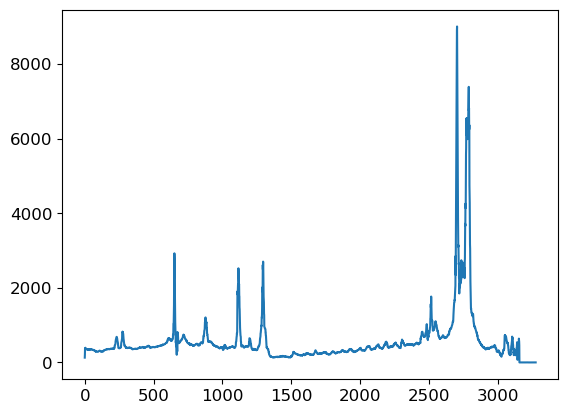

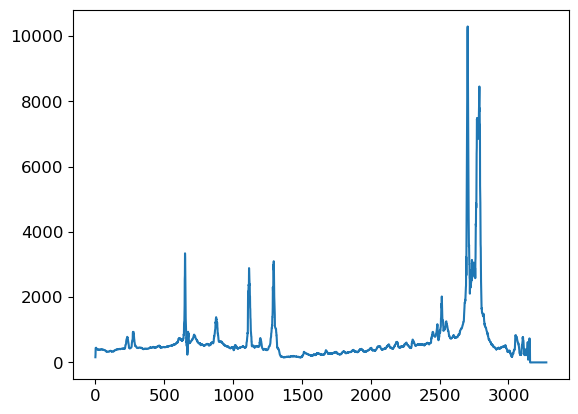

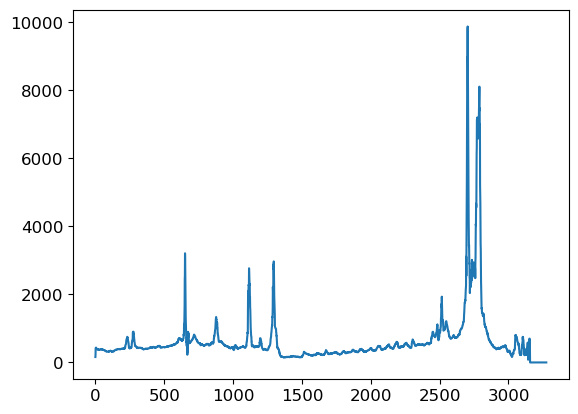

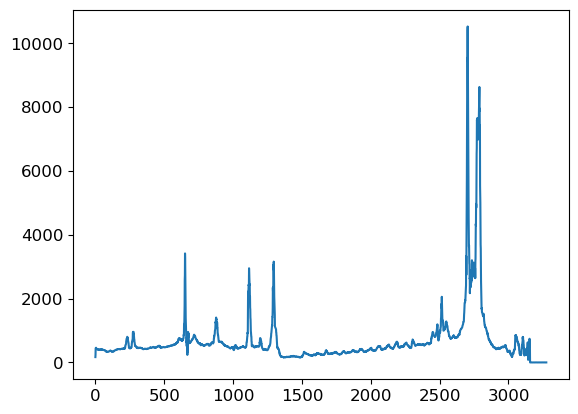

Epoch:[14001/35000] 	Batch:[1/3] 	Loss_D:0.6861 	Loss_G:0.8350 	D(x):-0.0120 	D(G(z)):-0.2333
Epoch:[14001/35000] 	Batch:[2/3] 	Loss_D:0.6342 	Loss_G:0.8203 	D(x):0.2182 	D(G(z)):-0.2000
Epoch:[14001/35000] 	Batch:[3/3] 	Loss_D:0.6651 	Loss_G:0.9053 	D(x):-0.1515 	D(G(z)):-0.3568
Epoch:[14002/35000] 	Batch:[1/3] 	Loss_D:0.6327 	Loss_G:0.8644 	D(x):0.1230 	D(G(z)):-0.3007
Epoch:[14002/35000] 	Batch:[2/3] 	Loss_D:0.6770 	Loss_G:0.8672 	D(x):-0.0771 	D(G(z)):-0.2982
Epoch:[14002/35000] 	Batch:[3/3] 	Loss_D:0.6738 	Loss_G:0.8153 	D(x):0.0300 	D(G(z)):-0.2037
Epoch:[14003/35000] 	Batch:[1/3] 	Loss_D:0.6630 	Loss_G:0.8922 	D(x):0.1508 	D(G(z)):-0.3381
Epoch:[14003/35000] 	Batch:[2/3] 	Loss_D:0.6826 	Loss_G:0.8738 	D(x):0.1475 	D(G(z)):-0.3058
Epoch:[14003/35000] 	Batch:[3/3] 	Loss_D:0.6684 	Loss_G:0.8431 	D(x):-0.0264 	D(G(z)):-0.2584
Epoch:[14004/35000] 	Batch:[1/3] 	Loss_D:0.6386 	Loss_G:0.8613 	D(x):0.2858 	D(G(z)):-0.2828
Epoch:[14004/35000] 	Batch:[2/3] 	Loss_D:0.6604 	Loss_G:0.8836 	D(

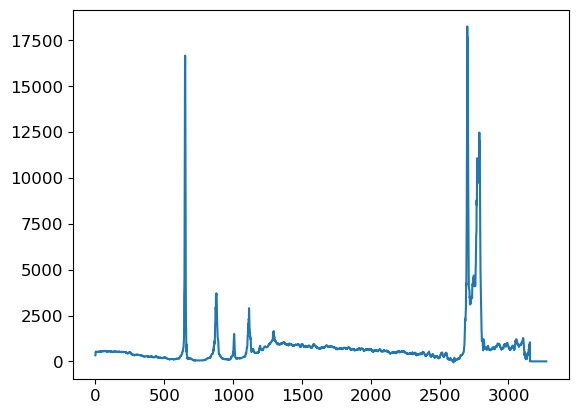

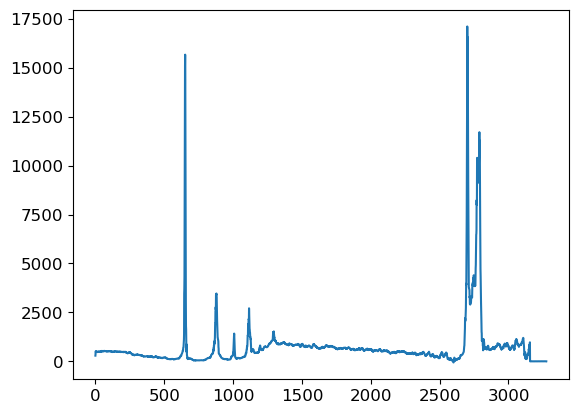

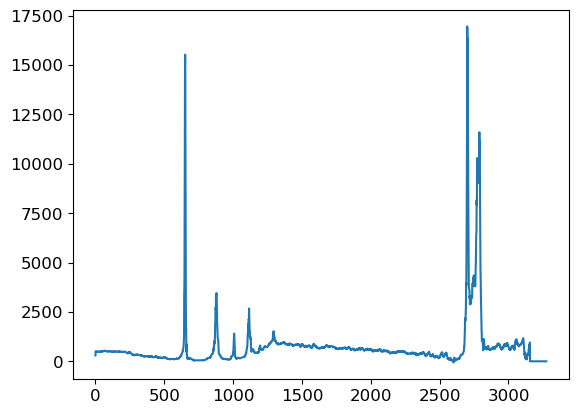

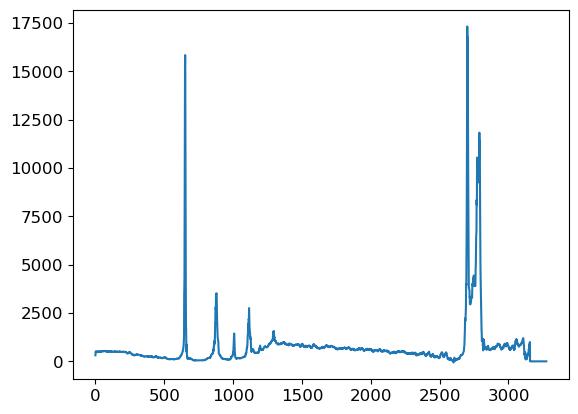

Epoch:[16001/35000] 	Batch:[1/3] 	Loss_D:0.7244 	Loss_G:0.8655 	D(x):-0.1935 	D(G(z)):-0.2774
Epoch:[16001/35000] 	Batch:[2/3] 	Loss_D:0.7651 	Loss_G:0.8599 	D(x):-0.3323 	D(G(z)):-0.2688
Epoch:[16001/35000] 	Batch:[3/3] 	Loss_D:0.9160 	Loss_G:0.8035 	D(x):-0.7327 	D(G(z)):-0.1845
Epoch:[16002/35000] 	Batch:[1/3] 	Loss_D:0.7180 	Loss_G:0.8368 	D(x):-0.2180 	D(G(z)):-0.2295
Epoch:[16002/35000] 	Batch:[2/3] 	Loss_D:0.6711 	Loss_G:0.9046 	D(x):-0.1453 	D(G(z)):-0.3549
Epoch:[16002/35000] 	Batch:[3/3] 	Loss_D:0.7695 	Loss_G:0.9291 	D(x):-0.5452 	D(G(z)):-0.4053
Epoch:[16003/35000] 	Batch:[1/3] 	Loss_D:0.7205 	Loss_G:0.8781 	D(x):-0.1449 	D(G(z)):-0.3032
Epoch:[16003/35000] 	Batch:[2/3] 	Loss_D:0.6816 	Loss_G:0.8624 	D(x):-0.1975 	D(G(z)):-0.2852
Epoch:[16003/35000] 	Batch:[3/3] 	Loss_D:0.7752 	Loss_G:0.8642 	D(x):-0.4354 	D(G(z)):-0.2708
Epoch:[16004/35000] 	Batch:[1/3] 	Loss_D:0.6918 	Loss_G:0.8918 	D(x):-0.1701 	D(G(z)):-0.3252
Epoch:[16004/35000] 	Batch:[2/3] 	Loss_D:0.6957 	Loss_G:0.88

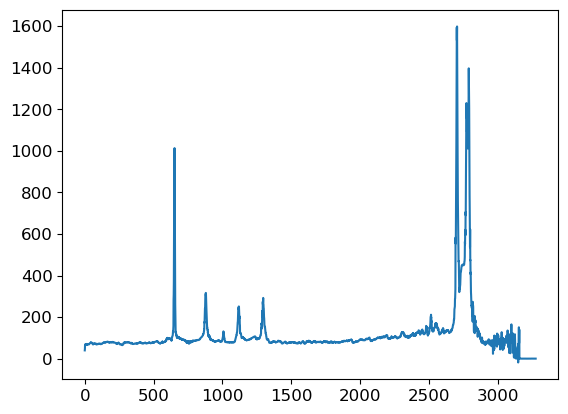

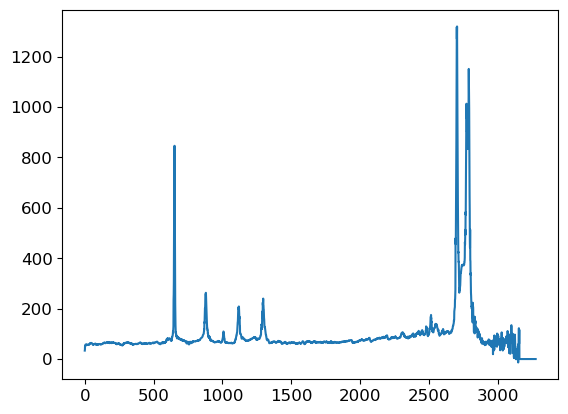

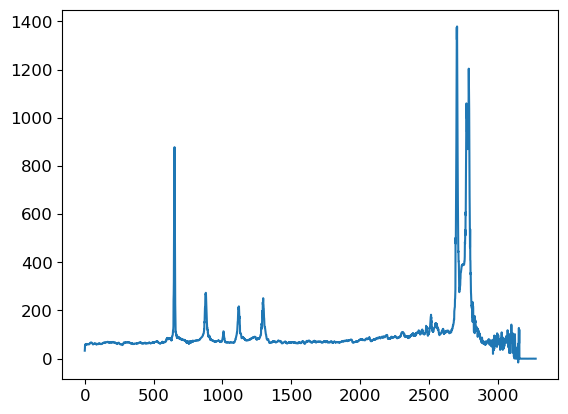

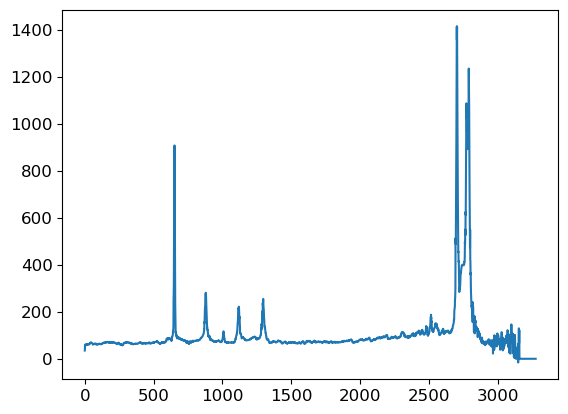

Epoch:[18001/35000] 	Batch:[1/3] 	Loss_D:0.6180 	Loss_G:0.7925 	D(x):0.5641 	D(G(z)):-0.1897
Epoch:[18001/35000] 	Batch:[2/3] 	Loss_D:0.5858 	Loss_G:0.7912 	D(x):1.0103 	D(G(z)):-0.1872
Epoch:[18001/35000] 	Batch:[3/3] 	Loss_D:0.5897 	Loss_G:0.7967 	D(x):0.9809 	D(G(z)):-0.1972
Epoch:[18002/35000] 	Batch:[1/3] 	Loss_D:0.5891 	Loss_G:0.7904 	D(x):0.9181 	D(G(z)):-0.1857
Epoch:[18002/35000] 	Batch:[2/3] 	Loss_D:0.5971 	Loss_G:0.7906 	D(x):0.9020 	D(G(z)):-0.1861
Epoch:[18002/35000] 	Batch:[3/3] 	Loss_D:0.6177 	Loss_G:0.7863 	D(x):0.4443 	D(G(z)):-0.1783
Epoch:[18003/35000] 	Batch:[1/3] 	Loss_D:0.6055 	Loss_G:0.7905 	D(x):0.6108 	D(G(z)):-0.1859
Epoch:[18003/35000] 	Batch:[2/3] 	Loss_D:0.5908 	Loss_G:0.7897 	D(x):1.0753 	D(G(z)):-0.1846
Epoch:[18003/35000] 	Batch:[3/3] 	Loss_D:0.6004 	Loss_G:0.7858 	D(x):0.5512 	D(G(z)):-0.1772
Epoch:[18004/35000] 	Batch:[1/3] 	Loss_D:0.6039 	Loss_G:0.7871 	D(x):0.6932 	D(G(z)):-0.1798
Epoch:[18004/35000] 	Batch:[2/3] 	Loss_D:0.6118 	Loss_G:0.7883 	D(x):0

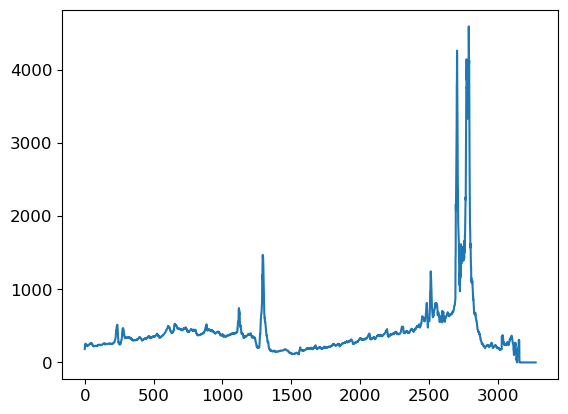

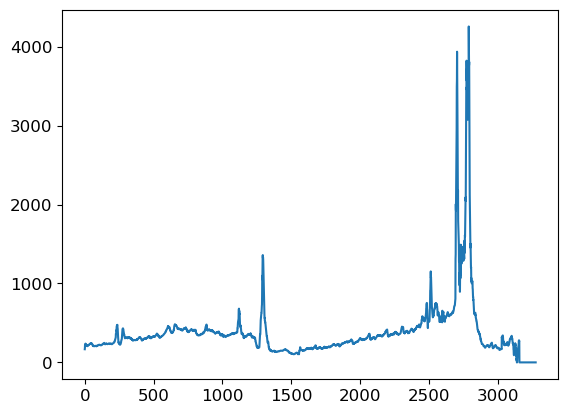

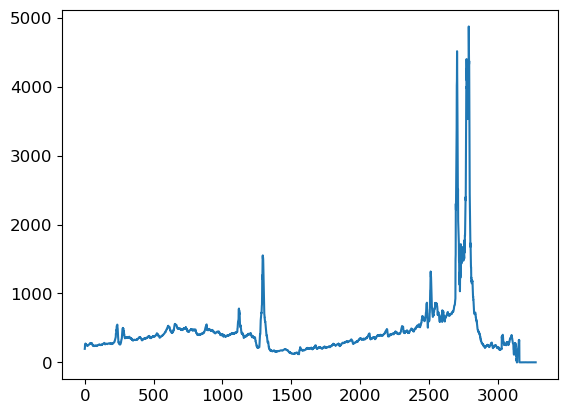

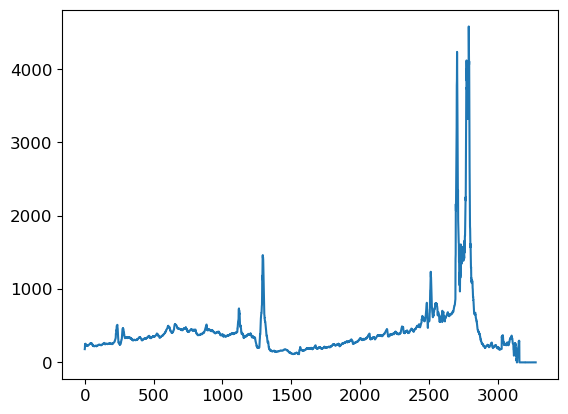

Epoch:[20001/35000] 	Batch:[1/3] 	Loss_D:0.6268 	Loss_G:0.7981 	D(x):0.3353 	D(G(z)):-0.1951
Epoch:[20001/35000] 	Batch:[2/3] 	Loss_D:0.6407 	Loss_G:0.8073 	D(x):0.3664 	D(G(z)):-0.2123
Epoch:[20001/35000] 	Batch:[3/3] 	Loss_D:0.6177 	Loss_G:0.8216 	D(x):0.5106 	D(G(z)):-0.2394
Epoch:[20002/35000] 	Batch:[1/3] 	Loss_D:0.6006 	Loss_G:0.8029 	D(x):0.5027 	D(G(z)):-0.2031
Epoch:[20002/35000] 	Batch:[2/3] 	Loss_D:0.6353 	Loss_G:0.8129 	D(x):0.2279 	D(G(z)):-0.2230
Epoch:[20002/35000] 	Batch:[3/3] 	Loss_D:0.5988 	Loss_G:0.7749 	D(x):0.5601 	D(G(z)):-0.1557
Epoch:[20003/35000] 	Batch:[1/3] 	Loss_D:0.6413 	Loss_G:0.8112 	D(x):0.3002 	D(G(z)):-0.2205
Epoch:[20003/35000] 	Batch:[2/3] 	Loss_D:0.6046 	Loss_G:0.7970 	D(x):0.7062 	D(G(z)):-0.1944
Epoch:[20003/35000] 	Batch:[3/3] 	Loss_D:0.6120 	Loss_G:0.7762 	D(x):0.3921 	D(G(z)):-0.1578
Epoch:[20004/35000] 	Batch:[1/3] 	Loss_D:0.6491 	Loss_G:0.8013 	D(x):0.1872 	D(G(z)):-0.2022
Epoch:[20004/35000] 	Batch:[2/3] 	Loss_D:0.6098 	Loss_G:0.7940 	D(x):0

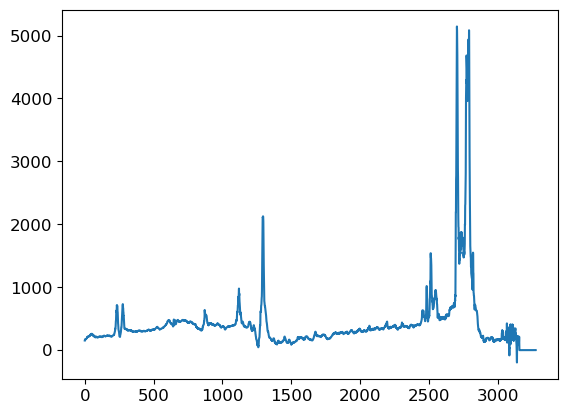

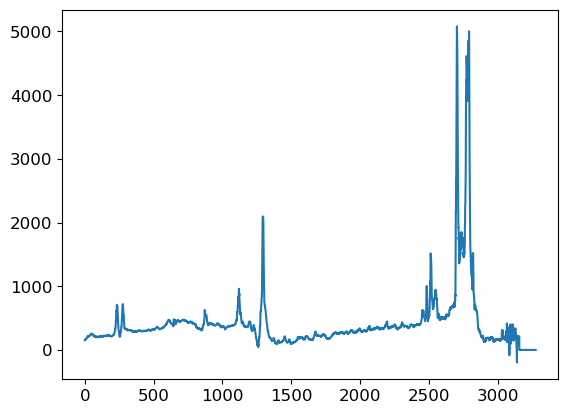

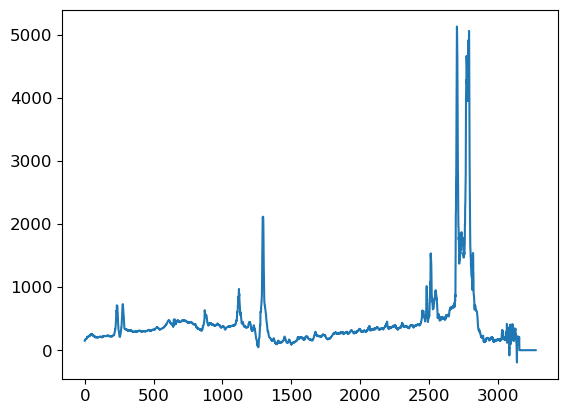

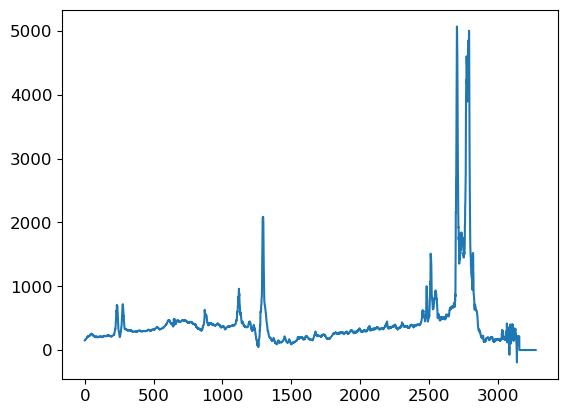

Epoch:[22001/35000] 	Batch:[1/3] 	Loss_D:0.6569 	Loss_G:0.8667 	D(x):-0.0073 	D(G(z)):-0.3160
Epoch:[22001/35000] 	Batch:[2/3] 	Loss_D:0.6725 	Loss_G:0.8272 	D(x):-0.0823 	D(G(z)):-0.2477
Epoch:[22001/35000] 	Batch:[3/3] 	Loss_D:0.5929 	Loss_G:0.8189 	D(x):0.3265 	D(G(z)):-0.2345
Epoch:[22002/35000] 	Batch:[1/3] 	Loss_D:0.6452 	Loss_G:0.8363 	D(x):-0.0597 	D(G(z)):-0.2650
Epoch:[22002/35000] 	Batch:[2/3] 	Loss_D:0.6544 	Loss_G:0.8516 	D(x):0.0415 	D(G(z)):-0.2906
Epoch:[22002/35000] 	Batch:[3/3] 	Loss_D:0.6810 	Loss_G:0.8548 	D(x):-0.1056 	D(G(z)):-0.3000
Epoch:[22003/35000] 	Batch:[1/3] 	Loss_D:0.6563 	Loss_G:0.8282 	D(x):0.0009 	D(G(z)):-0.2504
Epoch:[22003/35000] 	Batch:[2/3] 	Loss_D:0.6455 	Loss_G:0.8368 	D(x):0.0946 	D(G(z)):-0.2652
Epoch:[22003/35000] 	Batch:[3/3] 	Loss_D:0.6168 	Loss_G:0.8422 	D(x):0.2161 	D(G(z)):-0.2743
Epoch:[22004/35000] 	Batch:[1/3] 	Loss_D:0.6428 	Loss_G:0.8260 	D(x):0.0731 	D(G(z)):-0.2466
Epoch:[22004/35000] 	Batch:[2/3] 	Loss_D:0.6457 	Loss_G:0.8047 	D(

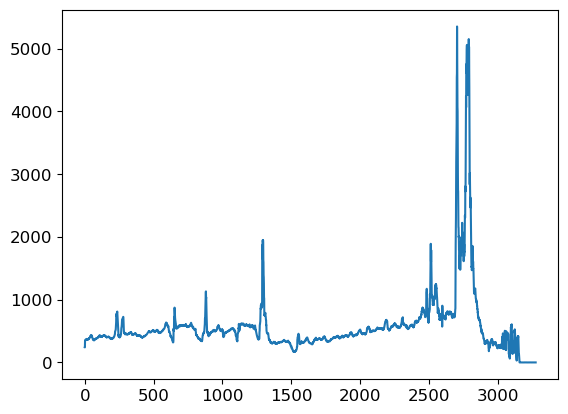

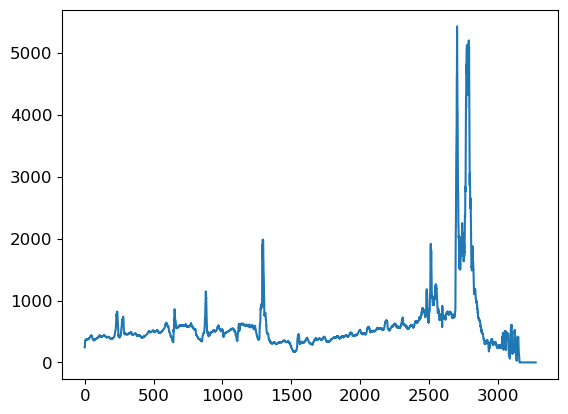

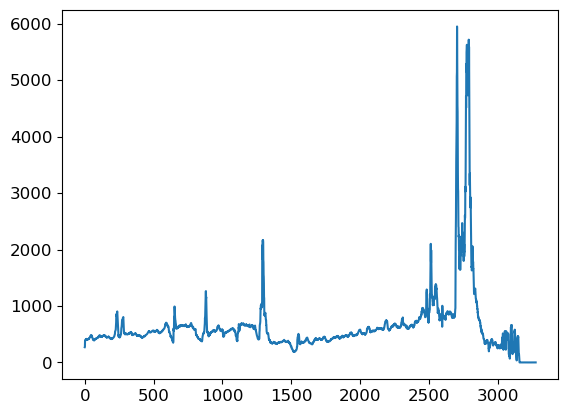

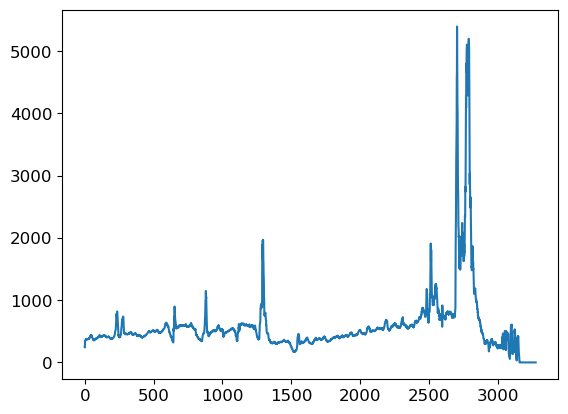

Epoch:[24001/35000] 	Batch:[1/3] 	Loss_D:0.5758 	Loss_G:0.9167 	D(x):0.6082 	D(G(z)):-0.3991
Epoch:[24001/35000] 	Batch:[2/3] 	Loss_D:0.5900 	Loss_G:0.9139 	D(x):0.5253 	D(G(z)):-0.3958
Epoch:[24001/35000] 	Batch:[3/3] 	Loss_D:0.5618 	Loss_G:0.8943 	D(x):0.6776 	D(G(z)):-0.3628
Epoch:[24002/35000] 	Batch:[1/3] 	Loss_D:0.5657 	Loss_G:0.9242 	D(x):0.6717 	D(G(z)):-0.4135
Epoch:[24002/35000] 	Batch:[2/3] 	Loss_D:0.6065 	Loss_G:0.9113 	D(x):0.4431 	D(G(z)):-0.3910
Epoch:[24002/35000] 	Batch:[3/3] 	Loss_D:0.5649 	Loss_G:0.9026 	D(x):0.6471 	D(G(z)):-0.3798
Epoch:[24003/35000] 	Batch:[1/3] 	Loss_D:0.5901 	Loss_G:0.9121 	D(x):0.4721 	D(G(z)):-0.3920
Epoch:[24003/35000] 	Batch:[2/3] 	Loss_D:0.6011 	Loss_G:0.9083 	D(x):0.4439 	D(G(z)):-0.3882
Epoch:[24003/35000] 	Batch:[3/3] 	Loss_D:0.5463 	Loss_G:0.8990 	D(x):1.1022 	D(G(z)):-0.3736
Epoch:[24004/35000] 	Batch:[1/3] 	Loss_D:0.5993 	Loss_G:0.9119 	D(x):0.5817 	D(G(z)):-0.3937
Epoch:[24004/35000] 	Batch:[2/3] 	Loss_D:0.5715 	Loss_G:0.8858 	D(x):0

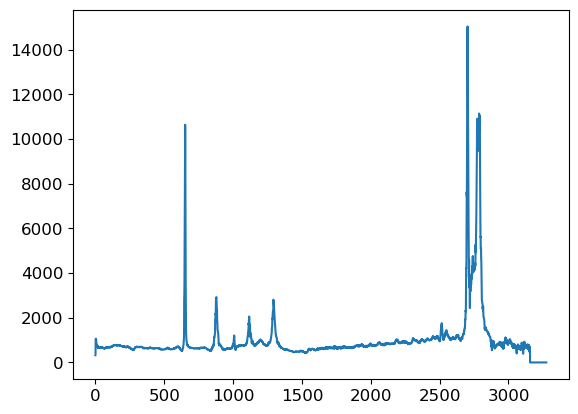

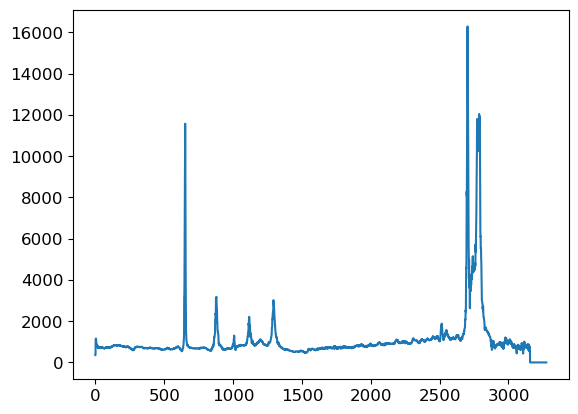

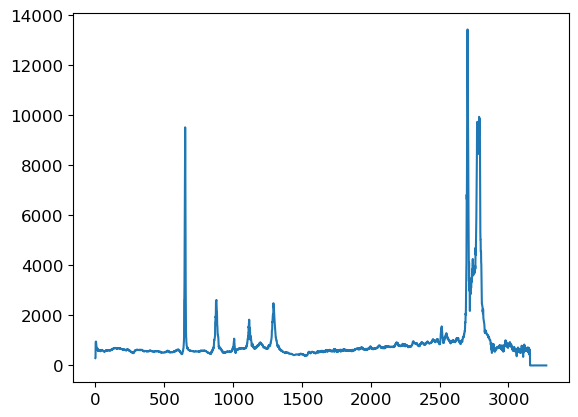

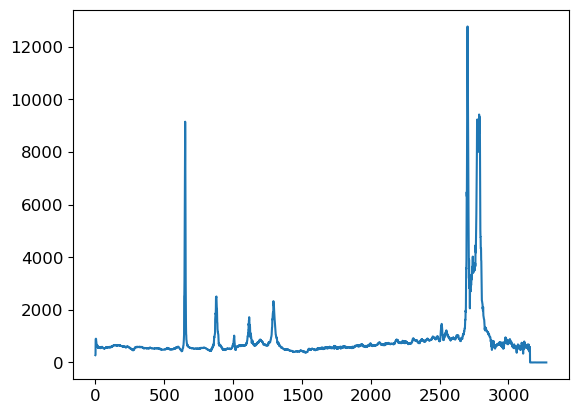

Epoch:[26001/35000] 	Batch:[1/3] 	Loss_D:0.6858 	Loss_G:0.6764 	D(x):0.0489 	D(G(z)):0.0444
Epoch:[26001/35000] 	Batch:[2/3] 	Loss_D:0.7002 	Loss_G:0.7018 	D(x):0.1208 	D(G(z)):-0.0022
Epoch:[26001/35000] 	Batch:[3/3] 	Loss_D:0.7269 	Loss_G:0.6946 	D(x):0.1537 	D(G(z)):0.0058
Epoch:[26002/35000] 	Batch:[1/3] 	Loss_D:0.7538 	Loss_G:0.6132 	D(x):0.0990 	D(G(z)):0.1913
Epoch:[26002/35000] 	Batch:[2/3] 	Loss_D:0.7911 	Loss_G:0.5577 	D(x):0.0714 	D(G(z)):0.3257
Epoch:[26002/35000] 	Batch:[3/3] 	Loss_D:0.8390 	Loss_G:0.5525 	D(x):-0.0155 	D(G(z)):0.3600
Epoch:[26003/35000] 	Batch:[1/3] 	Loss_D:0.8373 	Loss_G:0.5242 	D(x):0.1050 	D(G(z)):0.4301
Epoch:[26003/35000] 	Batch:[2/3] 	Loss_D:0.9150 	Loss_G:0.4729 	D(x):0.0169 	D(G(z)):0.5576
Epoch:[26003/35000] 	Batch:[3/3] 	Loss_D:1.0184 	Loss_G:0.4115 	D(x):0.1461 	D(G(z)):0.7214
Epoch:[26004/35000] 	Batch:[1/3] 	Loss_D:0.9987 	Loss_G:0.3548 	D(x):0.1361 	D(G(z)):0.9616
Epoch:[26004/35000] 	Batch:[2/3] 	Loss_D:1.1008 	Loss_G:0.3296 	D(x):0.0979 	D

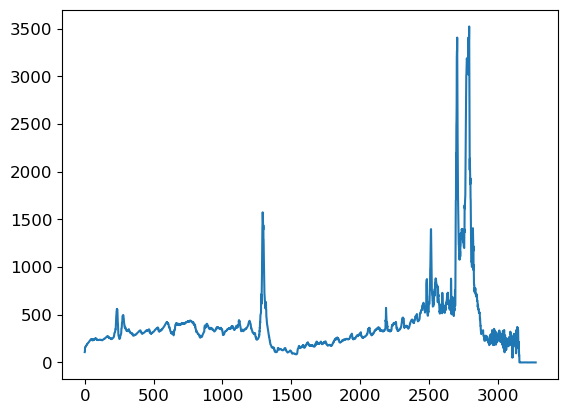

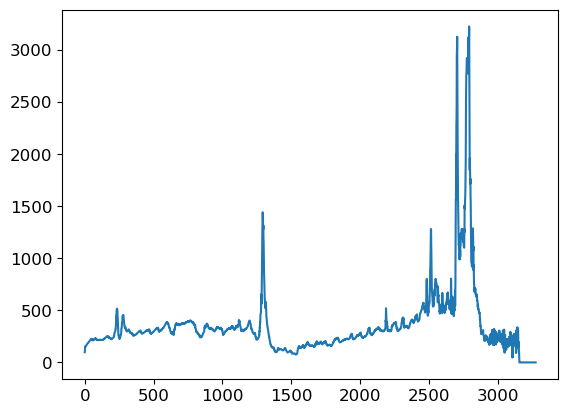

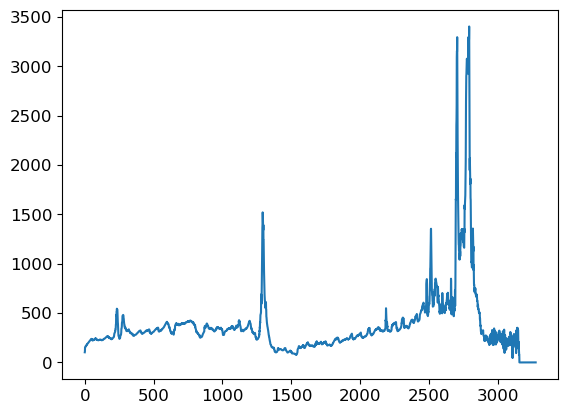

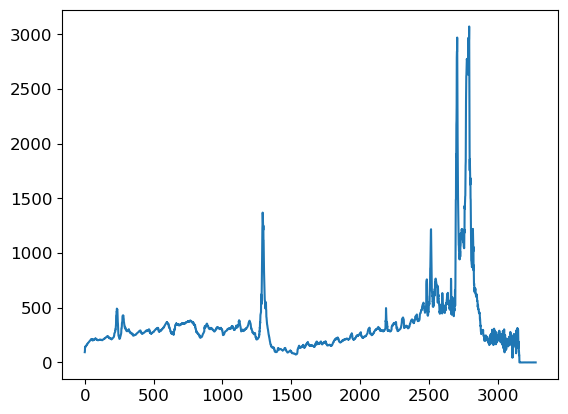

Epoch:[28001/35000] 	Batch:[1/3] 	Loss_D:0.6010 	Loss_G:0.8218 	D(x):0.6177 	D(G(z)):-0.2409
Epoch:[28001/35000] 	Batch:[2/3] 	Loss_D:0.6056 	Loss_G:0.8195 	D(x):0.7811 	D(G(z)):-0.2356
Epoch:[28001/35000] 	Batch:[3/3] 	Loss_D:0.5892 	Loss_G:0.8388 	D(x):1.2291 	D(G(z)):-0.2704
Epoch:[28002/35000] 	Batch:[1/3] 	Loss_D:0.6127 	Loss_G:0.8246 	D(x):0.6839 	D(G(z)):-0.2459
Epoch:[28002/35000] 	Batch:[2/3] 	Loss_D:0.6221 	Loss_G:0.8062 	D(x):0.4748 	D(G(z)):-0.2126
Epoch:[28002/35000] 	Batch:[3/3] 	Loss_D:0.5289 	Loss_G:0.8086 	D(x):1.2774 	D(G(z)):-0.2162
Epoch:[28003/35000] 	Batch:[1/3] 	Loss_D:0.6172 	Loss_G:0.8060 	D(x):0.6901 	D(G(z)):-0.2127
Epoch:[28003/35000] 	Batch:[2/3] 	Loss_D:0.6143 	Loss_G:0.8212 	D(x):0.7303 	D(G(z)):-0.2398
Epoch:[28003/35000] 	Batch:[3/3] 	Loss_D:0.5718 	Loss_G:0.7993 	D(x):1.2739 	D(G(z)):-0.1998
Epoch:[28004/35000] 	Batch:[1/3] 	Loss_D:0.6083 	Loss_G:0.8167 	D(x):0.6957 	D(G(z)):-0.2319
Epoch:[28004/35000] 	Batch:[2/3] 	Loss_D:0.6026 	Loss_G:0.8098 	D(x):0

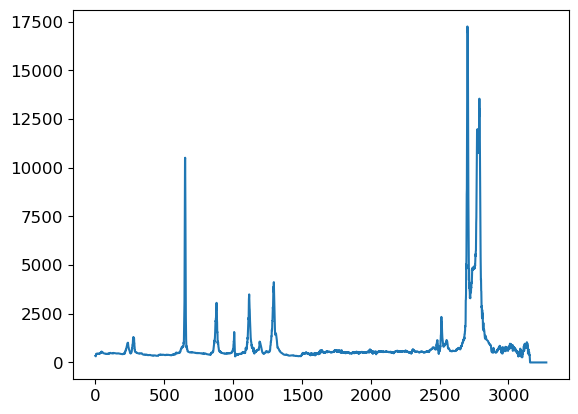

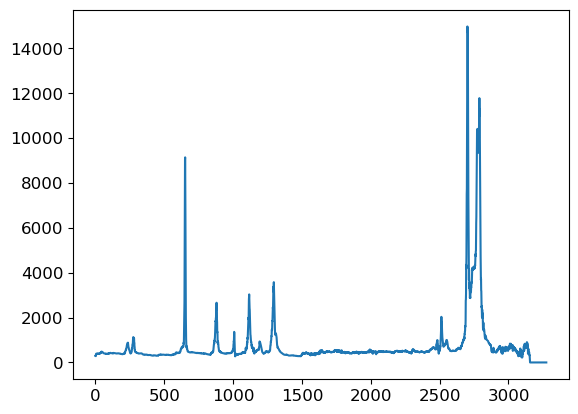

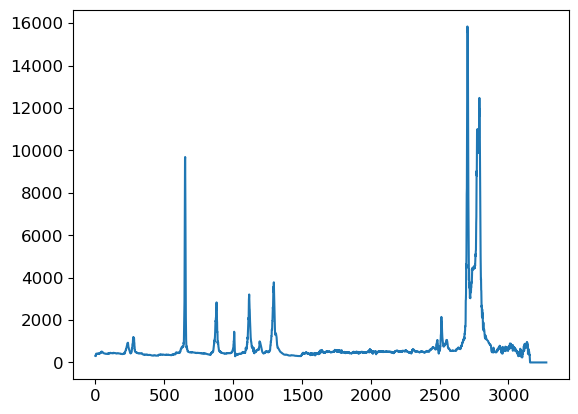

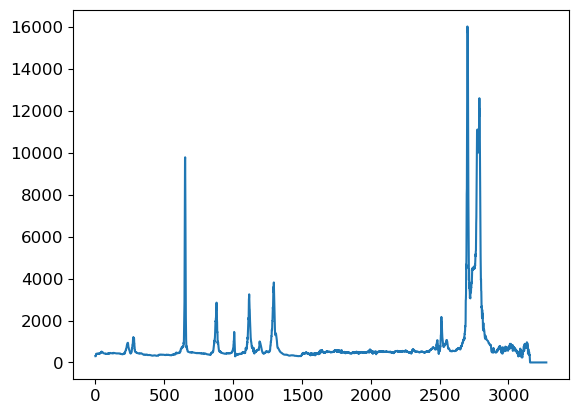

Epoch:[30001/35000] 	Batch:[1/3] 	Loss_D:0.7028 	Loss_G:0.7431 	D(x):-0.0681 	D(G(z)):-0.0909
Epoch:[30001/35000] 	Batch:[2/3] 	Loss_D:0.6805 	Loss_G:0.7291 	D(x):0.0167 	D(G(z)):-0.0624
Epoch:[30001/35000] 	Batch:[3/3] 	Loss_D:0.6349 	Loss_G:0.7737 	D(x):0.1734 	D(G(z)):-0.1479
Epoch:[30002/35000] 	Batch:[1/3] 	Loss_D:0.7065 	Loss_G:0.7521 	D(x):-0.0456 	D(G(z)):-0.1080
Epoch:[30002/35000] 	Batch:[2/3] 	Loss_D:0.6732 	Loss_G:0.7241 	D(x):0.1117 	D(G(z)):-0.0500
Epoch:[30002/35000] 	Batch:[3/3] 	Loss_D:0.6829 	Loss_G:0.7663 	D(x):0.1579 	D(G(z)):-0.1303
Epoch:[30003/35000] 	Batch:[1/3] 	Loss_D:0.7134 	Loss_G:0.7179 	D(x):-0.0443 	D(G(z)):-0.0391
Epoch:[30003/35000] 	Batch:[2/3] 	Loss_D:0.6984 	Loss_G:0.6979 	D(x):0.0299 	D(G(z)):0.0002
Epoch:[30003/35000] 	Batch:[3/3] 	Loss_D:0.6601 	Loss_G:0.7026 	D(x):0.3136 	D(G(z)):-0.0142
Epoch:[30004/35000] 	Batch:[1/3] 	Loss_D:0.7018 	Loss_G:0.7251 	D(x):0.0258 	D(G(z)):-0.0532
Epoch:[30004/35000] 	Batch:[2/3] 	Loss_D:0.7014 	Loss_G:0.7020 	D(x)

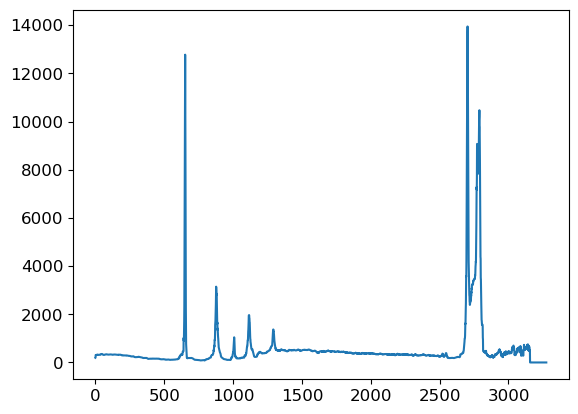

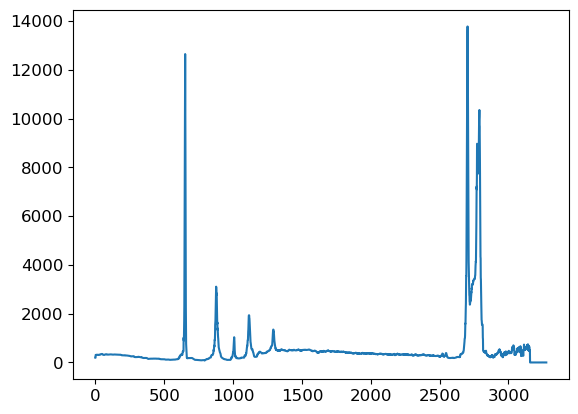

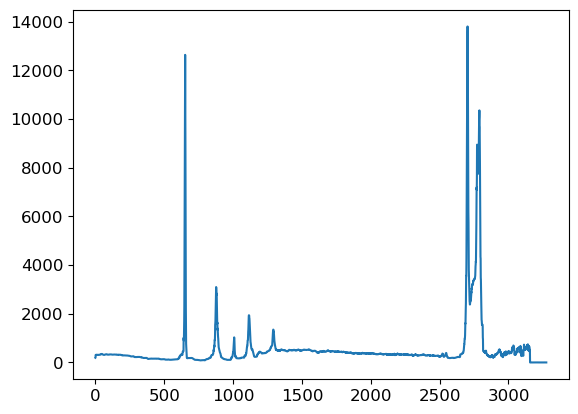

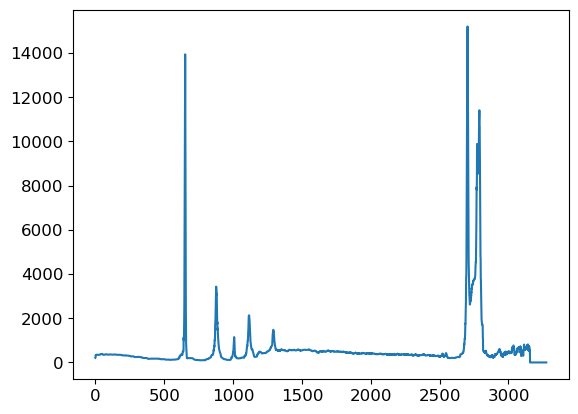

Epoch:[32001/35000] 	Batch:[1/3] 	Loss_D:0.6815 	Loss_G:0.7742 	D(x):-0.0829 	D(G(z)):-0.1483
Epoch:[32001/35000] 	Batch:[2/3] 	Loss_D:0.6964 	Loss_G:0.7728 	D(x):-0.1067 	D(G(z)):-0.1471
Epoch:[32001/35000] 	Batch:[3/3] 	Loss_D:0.6710 	Loss_G:0.7850 	D(x):-0.0873 	D(G(z)):-0.1701
Epoch:[32002/35000] 	Batch:[1/3] 	Loss_D:0.6733 	Loss_G:0.7670 	D(x):-0.0194 	D(G(z)):-0.1356
Epoch:[32002/35000] 	Batch:[2/3] 	Loss_D:0.6993 	Loss_G:0.7739 	D(x):-0.1366 	D(G(z)):-0.1461
Epoch:[32002/35000] 	Batch:[3/3] 	Loss_D:0.6751 	Loss_G:0.7670 	D(x):0.0221 	D(G(z)):-0.1365
Epoch:[32003/35000] 	Batch:[1/3] 	Loss_D:0.6877 	Loss_G:0.7807 	D(x):-0.0500 	D(G(z)):-0.1623
Epoch:[32003/35000] 	Batch:[2/3] 	Loss_D:0.6695 	Loss_G:0.7694 	D(x):-0.0261 	D(G(z)):-0.1408
Epoch:[32003/35000] 	Batch:[3/3] 	Loss_D:0.6955 	Loss_G:0.7803 	D(x):-0.0686 	D(G(z)):-0.1567
Epoch:[32004/35000] 	Batch:[1/3] 	Loss_D:0.6905 	Loss_G:0.7523 	D(x):-0.0347 	D(G(z)):-0.1078
Epoch:[32004/35000] 	Batch:[2/3] 	Loss_D:0.6545 	Loss_G:0.777

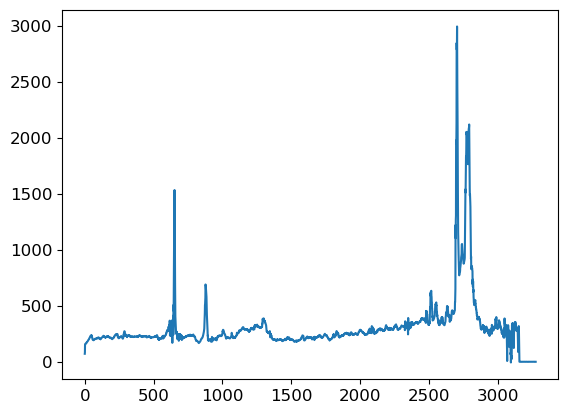

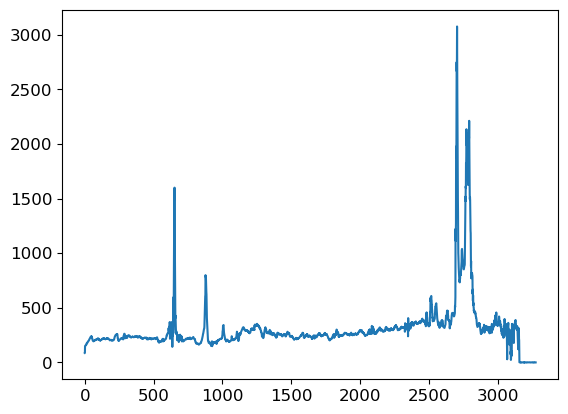

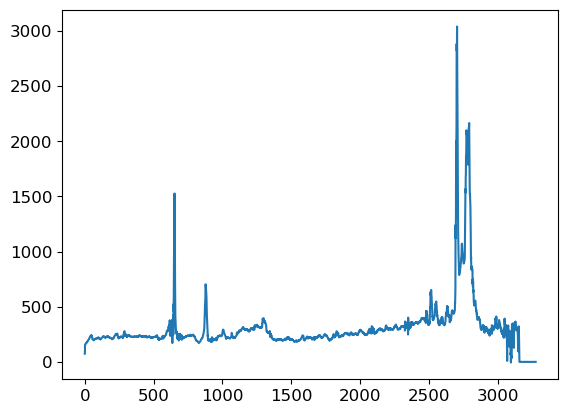

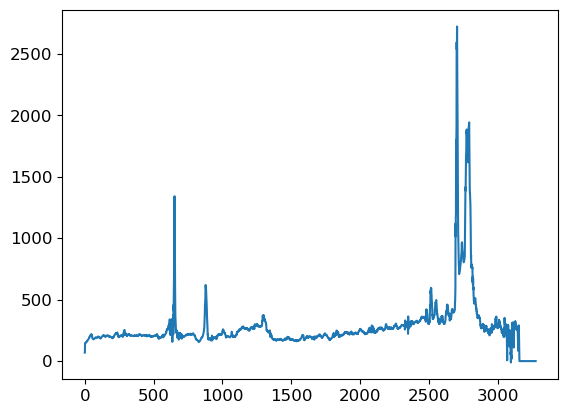

Epoch:[34001/35000] 	Batch:[1/3] 	Loss_D:0.5788 	Loss_G:0.7272 	D(x):1.7660 	D(G(z)):-0.0662
Epoch:[34001/35000] 	Batch:[2/3] 	Loss_D:0.6189 	Loss_G:0.7301 	D(x):1.0733 	D(G(z)):-0.0717
Epoch:[34001/35000] 	Batch:[3/3] 	Loss_D:0.5885 	Loss_G:0.7266 	D(x):2.0136 	D(G(z)):-0.0648
Epoch:[34002/35000] 	Batch:[1/3] 	Loss_D:0.5896 	Loss_G:0.7282 	D(x):1.4349 	D(G(z)):-0.0678
Epoch:[34002/35000] 	Batch:[2/3] 	Loss_D:0.5961 	Loss_G:0.7267 	D(x):1.5384 	D(G(z)):-0.0651
Epoch:[34002/35000] 	Batch:[3/3] 	Loss_D:0.6403 	Loss_G:0.7292 	D(x):1.1504 	D(G(z)):-0.0700
Epoch:[34003/35000] 	Batch:[1/3] 	Loss_D:0.6012 	Loss_G:0.7183 	D(x):1.4998 	D(G(z)):-0.0487
Epoch:[34003/35000] 	Batch:[2/3] 	Loss_D:0.5797 	Loss_G:0.7201 	D(x):1.5744 	D(G(z)):-0.0521
Epoch:[34003/35000] 	Batch:[3/3] 	Loss_D:0.6377 	Loss_G:0.7092 	D(x):0.5339 	D(G(z)):-0.0304
Epoch:[34004/35000] 	Batch:[1/3] 	Loss_D:0.5998 	Loss_G:0.7168 	D(x):1.6030 	D(G(z)):-0.0455
Epoch:[34004/35000] 	Batch:[2/3] 	Loss_D:0.5880 	Loss_G:0.7168 	D(x):1

In [8]:
############################
# TRAINING
############################
sample_list = []
G_losses = []
D_losses = []

# track training time
start_time = time.time()

# Define training loop
for epoch in range(EPOCHS):
    for batch_idx, batch in enumerate(train_loader):
        itr_batch_size = batch.shape[0]  # Handle varying batch sizes
        
        # Labels
        real_labels = torch.ones((itr_batch_size, 1), dtype=torch.float, device=DEVICE)
        fake_labels = torch.zeros((itr_batch_size, 1), dtype=torch.float, device=DEVICE)
        
        # Real batch input
        real_spectra = batch.to(DEVICE)

        ############################
        # Discriminator
        # Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        opt_D.zero_grad() # reset optimiser each iteration

        # Real spectra predictions
        real_pred = discriminator(real_spectra)
        D_real_loss = loss_fn(real_pred, real_labels) # Loss on real samples
        
        # Generate fake spectra
        z = torch.randn(itr_batch_size, 1, Z_DIM, device=DEVICE)
        fake_spectra = generator(z).detach()  # Detach to prevent Generator gradients

        # Fake spectra predictions
        fake_pred = discriminator(fake_spectra)
        D_fake_loss = loss_fn(fake_pred, fake_labels) # Loss on fake samples

        # Combine real and fake losses
        D_loss = 0.5 * (D_real_loss + D_fake_loss) # average discriminator loss
        D_loss.backward()
        opt_D.step()

        ############################
        # Generator
        # Update G network: maximize log(1 - D(G(z)))
        ###########################
        opt_G.zero_grad() # reset optimiser each iteration

        # Sample noise for generator input, and generate batch of synthetic spectra
        z = torch.randn(itr_batch_size, 1, Z_DIM, device=DEVICE)  # standard normal
        fake_spectra = generator(z)
        fake_pred = discriminator(fake_spectra)
        
        # Generator loss: make discriminator believe fake data is real
        G_loss = loss_fn(fake_pred, real_labels)
        G_loss.backward() # calculate gradients
        opt_G.step() # update model
        
        ############################
        # Logging Scalars
        ############################
        # D(x) should stay close to 1.0 if x is real, and low if it comes from the generator (if using sigmoid output activation)
        D_x = real_pred.mean().item() # average probability prediction over real batch samples (unbounded when using BCELosswithLogits)

        # D(G(z)) is the probability prediction that the output of the generator is real, 
        # it will initially start low but should increase as the Generator improves
        D_G_z = fake_pred.mean().item() # average probability prediction over fake batch samples

        G_losses.append(G_loss.item())
        D_losses.append(D_loss.item())

        print(f'Epoch:[{epoch + 1}/{EPOCHS}] \tBatch:[{batch_idx+1}/{len(train_loader)}] \tLoss_D:{D_loss.item():.4f} \tLoss_G:{G_loss.item():.4f} \tD(x):{D_x:.4f} \tD(G(z)):{D_G_z:.4f}')
        
    # Draw some samples
    if (epoch + 1) % 2000 == 0:
        draw_synthetic_sample(generator, epoch + 1, SAMPLE_SHAPE)
        generator.train() # required again if we execute eval() to visualise samples during training

    ############################
    # Checkpointing
    # Checkpoint every few epochs so you can pull out an ideal model before it overfits or suffers mode collapse
    ############################

    # Commented out due to size of files on disk
    if (epoch + 1) % 1000 == 0:
        torch.save({
            "gen_state": generator.state_dict(),
            "dis_state": discriminator.state_dict(),
            "gen_opt_state": opt_G.state_dict(),
            "dis_opt_state": opt_D.state_dict(),
            "epoch": epoch,
            "g_loss": G_loss,
            "d_loss": D_loss
        }, f"./models/gan_checkpoints/gan_checkpoint_epoch_{epoch+1}.tar") # make sure gan_checkpoints folder exists
    
print("GAN took approx: %s minutes" % round((time.time() - start_time) / 60, 4))

## Plot losses

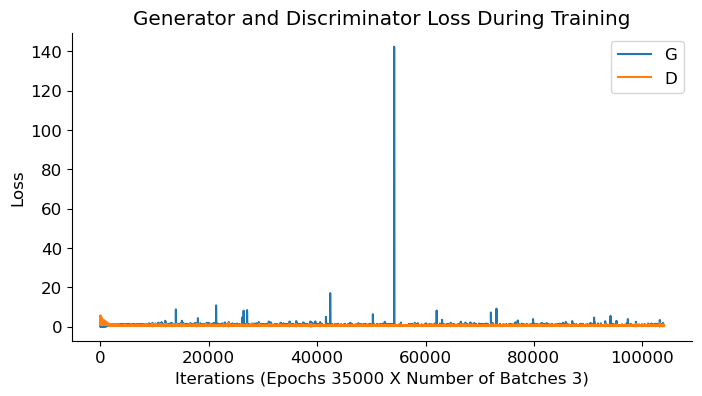

In [9]:
fig, ax = plt.subplots(figsize=(8, 4))
plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')
plt.ylabel("Loss")
plt.xlabel(f"Iterations (Epochs {EPOCHS} X Number of Batches {len(train_loader)})")
plt.title("Generator and Discriminator Loss During Training")
plt.grid(False)
plt.plot(G_losses[1000:],label="G")
plt.plot(D_losses[1000:],label="D")
plt.legend();

# Save model to disk

In [10]:
generator_path = "models/convolutional_gan_generator.pth"
torch.save(generator.state_dict(), generator_path)

# Load model from disk

In [11]:
# define new model
generator = Generator()

# Load the saved weights
generator.load_state_dict(torch.load(generator_path))
generator.to(DEVICE)
generator.eval()

# Generate some samples
noise = torch.randn(1000, 1, Z_DIM, device=DEVICE).detach()
synthetic_samples = generator(noise).detach().cpu().numpy().reshape(-1, 3276)

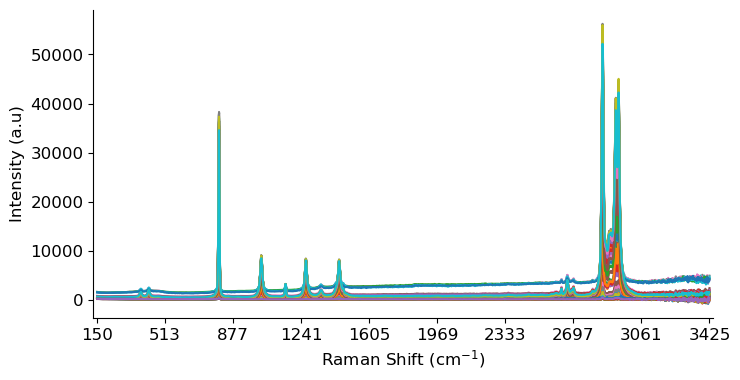

In [12]:
# Original spectra
_ = build_plot()
plt.plot(X.T);

Convolutional GANs are more difficult to design and train when compared to fully-connected networks utilising dense layers. However, they are capable of generating much more detailed data, as shown below. For this model, the only caveat is the group of zero intensity values at the final wavelengths. These values do not correspond to any vibrational or rotational modes, and as a result can be disregarded and discarded.

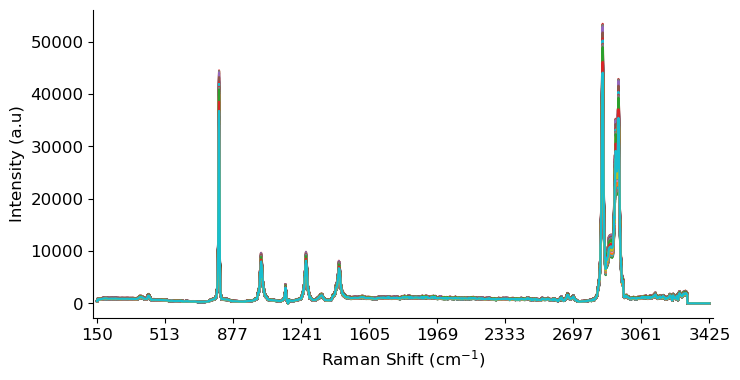

In [13]:
# New Synthetic spectra
_ = build_plot()
plt.plot(synthetic_samples.T);